Порядок выполнения работы

2. Низкочастотная фильтрация. Обработать полученные в
предыдущем пункте искаженные изображения фильтром
Гаусса и контргармоническим усредняющим фильтром с различными значениями параметра 𝑄.
80
3. Нелинейная фильтрация. Обработать полученные в первом
пункте искаженные изображения медианной, взвешенной медианной, ранговой и винеровской фильтрациями при различных размерах маски и ее коэффициентов. Реализовать адаптивную медианную фильтрацию.
4. Высокочастотная фильтрация. Выбрать исходное изображение. Выделить границы фильтрами Робертса, Превитта, Собела, Лапласа, алгоритмом Кэнни.

Содержание отчета
1. Титульный лист.
2. Цель работы.
3. Теоретическое обоснование применяемых методов и функций
фильтрации изображений.
4. Ход выполнения работы:
(a) Исходные изображения;
(b) Листинги программных реализаций;
(c) Комментарии;
(d) Результирующие изображения.
5. Выводы о проделанной работе.

In [1]:
import cv2
import cv2 as cv
import numpy
import numpy as np
# import skimage
import sys

In [2]:
from pa_utils import ShowImages

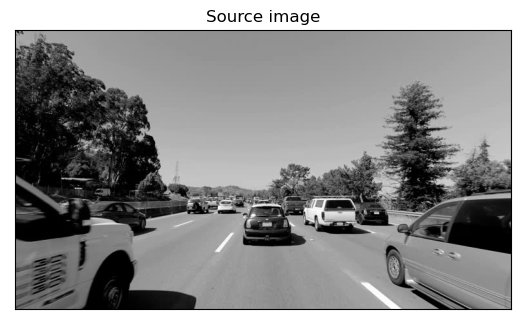

In [3]:
# Read an image from file in BGR
fn = "images/foto.jpg"
frame = cv.imread(fn, cv.IMREAD_COLOR)
if not isinstance(frame, np.ndarray) or frame.data == None:
  print("Error reading file \"{}\"".format(fn))
  exit()

# Convert BGR to grayscale
frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

# Display it
ShowImages([("Source image", frame)])

In [4]:
def SaltAndPepper(I, p = 0.05, s_vs_p = 0.5):
  # Select the salt value
  if I.dtype == np.uint8:
    salt = 255
  elif I.dtype == np.float32:
    salt = 1.0
  else:
    print("Unsopported image type")
    return None

  # Create an image
  Inoise = np.copy(I)
  # Get random value for each image poxel
  rng = np.random.default_rng()
  vals = rng.random(Inoise.shape)
  # Add salt
  Inoise[vals < p * s_vs_p] = salt
  # Add pepper
  Inoise[np.logical_and(vals >= p * s_vs_p, vals < p)] = 0
  
  return Inoise


def Speckle(I, var = 0.05):
  if I.dtype != np.uint8 and I.dtype != np.float32:
      print("Unsopported image values type.")
      return None

  # Generate a random number with normal distribution for each image pixel
  rng = np.random.default_rng()
  gauss = rng.normal(0, var ** 0.5, I.shape)

  # Add a multiple of this distribution to our image
  # The image values type should be taken into an account here 
  # as we should work with floating point values
  if I.dtype == np.uint8:
    out = (I.astype(np.float32) * (gauss + 1)).clip(0, 255).astype(np.uint8)
  else:
    out = I * (gauss + 1)

  return out

def Gaussian(I, mean = 0, var = 0.01):
  if I.dtype != np.uint8 and I.dtype != np.float32:
    print("Unsopported image values type.")
    return None

  rng = np.random.default_rng()
  gauss = rng.normal(mean, var ** 0.5, I.shape)
  
  if I.dtype == np.uint8:
    out = (I.astype(np.float32) + gauss * 255).clip(0, 255).astype(np.uint8)
  else:
    out = (I + gauss).astype(np.float32)
  
  return out


def Poisson(I):
  rng = np.random.default_rng()
  # We have to calculate the number of unique values then add
  # the poisson distribution noise basing on this number to
  # simulate the quantization noise
  if I.dtype == np.uint8:
    Ifloat = I.astype(np.float32) / 255
    vals = len(np.unique(Ifloat))
    vals = 2 ** np.ceil(np.log2(vals))
    out = (255 * (rng.poisson(Ifloat * vals) / float(vals)).clip(0, 1)).astype(np.uint8)
  elif I.dtype == np.float32:
    vals = len(np.unique(I))
    vals = 2 ** np.ceil(np.log2(vals))
    out = rng.poisson(I * vals) / float(vals)
  else:
    print("Unsopported image values type.")
    return None
  
  return out

1. Типы шумов. Выбрать произвольное изображение. Получить
искаженные различными шумами изображения с помощью
функции imnoise() с отличными от значений по умолчанию
параметрами.

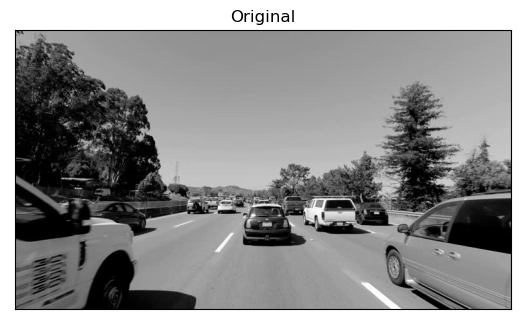

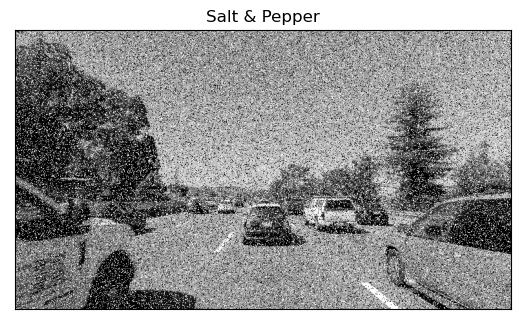

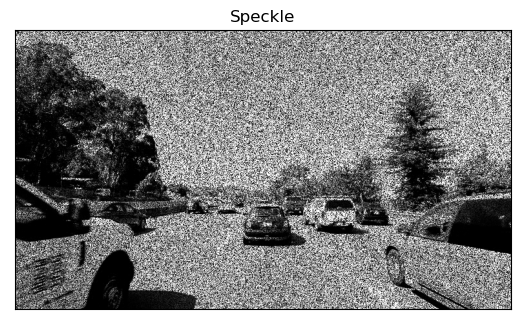

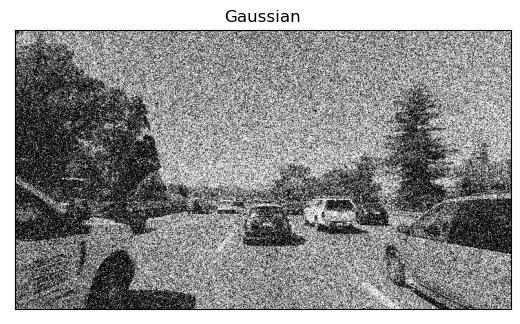

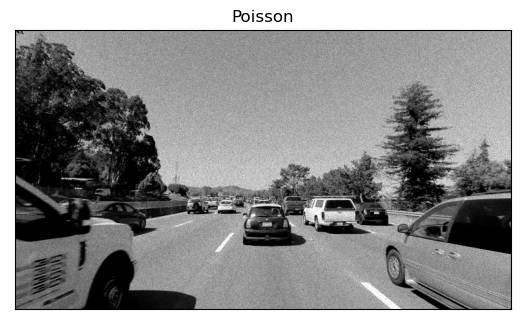

In [5]:
frames = [("Original", frame),
          ("Salt & Pepper", SaltAndPepper(frame, 0.25, 0.6)), 
          ("Speckle", Speckle(frame, 0.5)), 
          ("Gaussian", Gaussian(frame, 0, 0.15)), 
          ("Poisson", Poisson(frame))]

ShowImages(frames, 0)

2. Низкочастотная фильтрация. Обработать полученные в
предыдущем пункте искаженные изображения фильтром
Гаусса и контргармоническим усредняющим фильтром с различными значениями параметра 𝑄.
80

<h2>ГАУСС</h2>

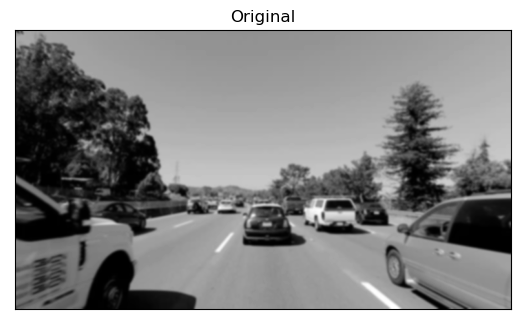

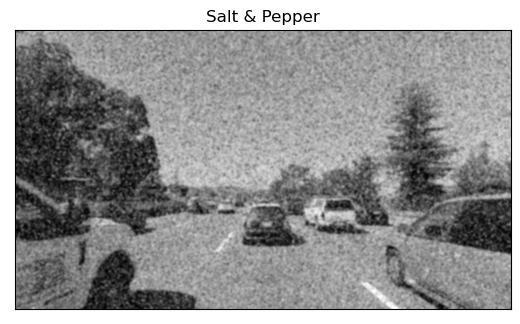

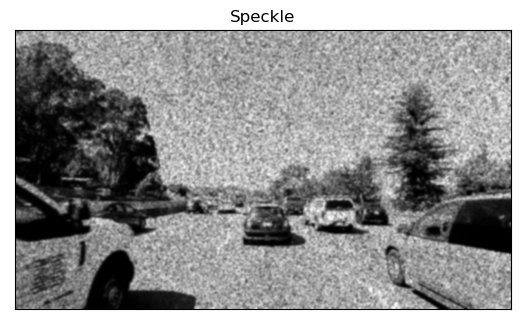

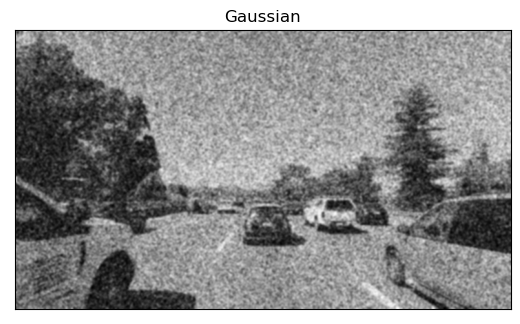

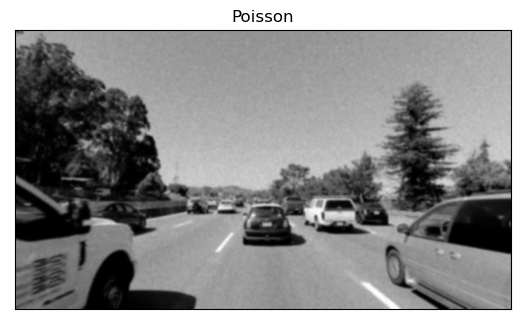

In [6]:
Iw1 = []
for img in frames:
    Iw1.append((img[0], cv.GaussianBlur(img[1], (7, 7), 0) ))  
ShowImages(Iw1, 0)

<h2>Контргармонический В ОТЧЕТ</h2>

In [7]:
def CounterharmonicMeanFilter(I, kernel_size, Q):
    rows, cols = I.shape[0:2]
    
    # Преобразуем изображение в float32 для вычислений
    if I.dtype == np.uint8:
        Icopy = I.astype(np.float32) / 255.0
    else:
        Icopy = I.copy()
    
    # Добавляем границы к изображению
    Icopy = cv.copyMakeBorder(Icopy, 
                               (kernel_size[0] - 1) // 2, kernel_size[0] // 2, 
                               (kernel_size[1] - 1) // 2, kernel_size[1] // 2, 
                               cv.BORDER_REPLICATE)
    
    # Создаем пустой массив для выходного изображения
    Iout = np.zeros_like(Icopy, dtype=np.float32)
    
    # Маленькое значение для предотвращения деления на ноль
    epsilon = 1e-8
    
    # Проходим по изображению
    for i in range(rows):
        for j in range(cols):
            # Извлекаем окно
            region = Icopy[i:i + kernel_size[0], j:j + kernel_size[1]]
            
            # Заменяем нули на маленькое значение для отрицательных Q
            region_safe = np.where(region == 0, epsilon, region)

            # Вычисляем числитель и знаменатель
            numerator = np.sum(np.power(region_safe, Q + 1))
            denominator = np.sum(np.power(region_safe, Q))
            
            # Проверяем деление на ноль
            if denominator != 0:
                Iout[i, j] = numerator / denominator
            else:
                Iout[i, j] = Icopy[i, j]  # Оставляем пиксель без изменений
    
    # Возвращаем изображение в 8-битный формат, если оно было таким изначально
    if I.dtype == np.uint8:
        Iout = np.clip(Iout * 255, 0, 255).astype(np.uint8)
    
    return Iout


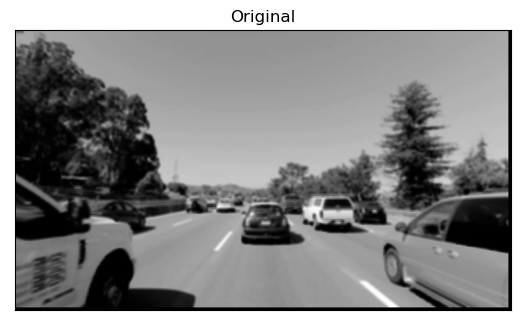

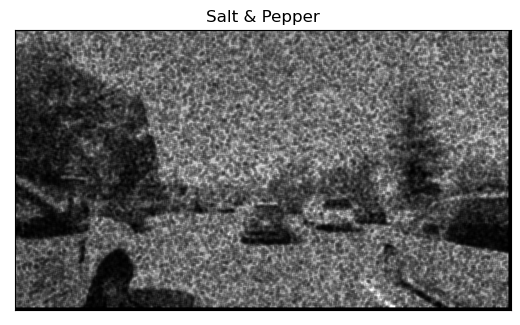

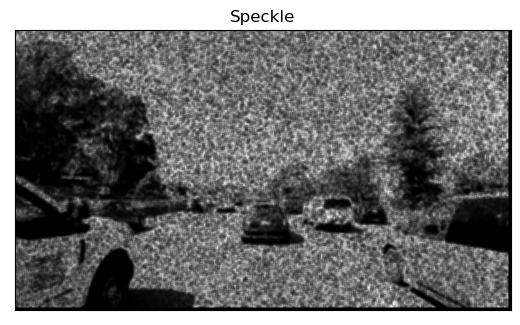

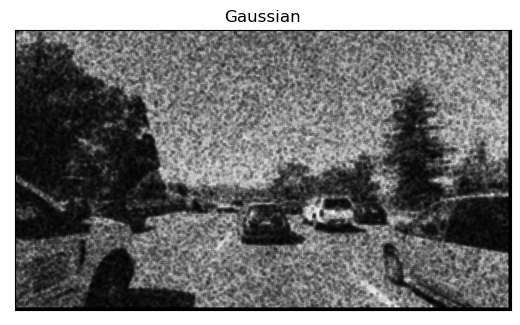

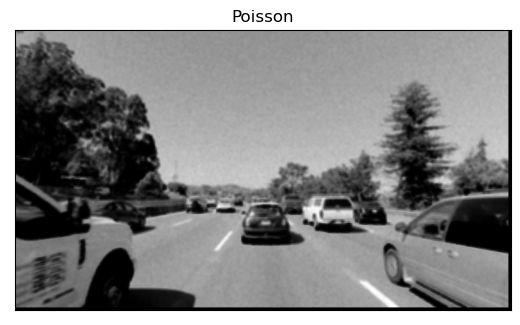

In [8]:
Ichmean = []
# Q = (-0.5, 0.5, 1, 2)
# for q in Q:
for img in frames:
    Ichmean.append((img[0], CounterharmonicMeanFilter(img[1], (5, 5),-0.1)))
ShowImages(Ichmean, 0)

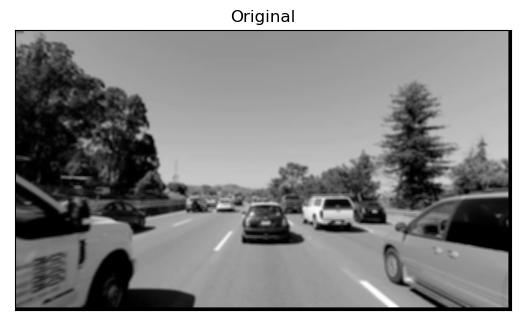

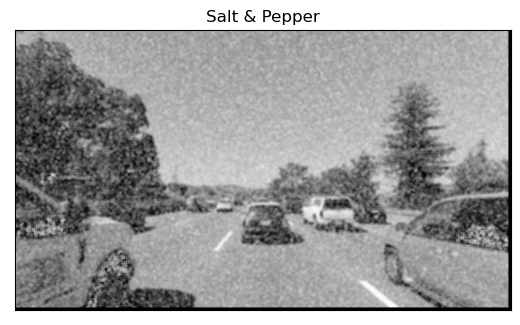

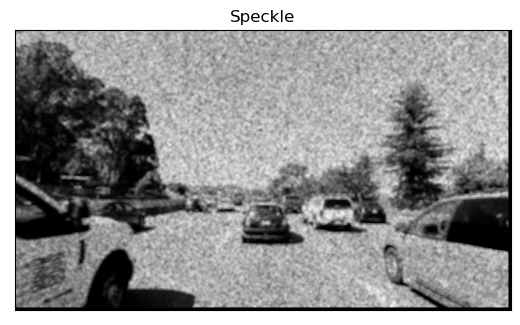

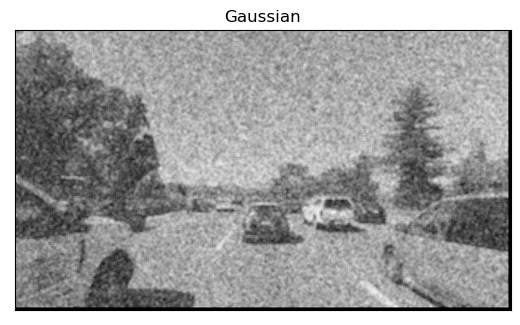

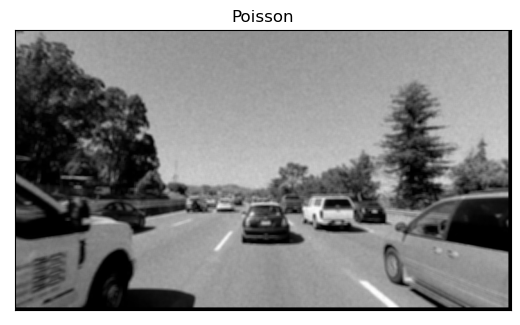

In [9]:
Ichmean = []
# Q = (-0.5, 0.5, 1, 2)
# for q in Q:
for img in frames:
    Ichmean.append((img[0], CounterharmonicMeanFilter(img[1], (5, 5), 0.1)))
ShowImages(Ichmean, 0)

3. Нелинейная фильтрация. Обработать полученные в первом
пункте искаженные изображения медианной, взвешенной медианной, ранговой и винеровской фильтрациями при различных размерах маски и ее коэффициентов. Реализовать адаптивную медианную фильтрацию.

<h2>медианной</h2>

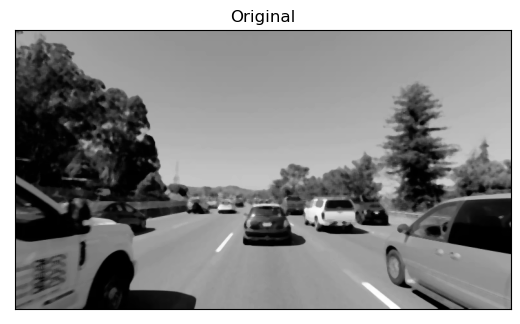

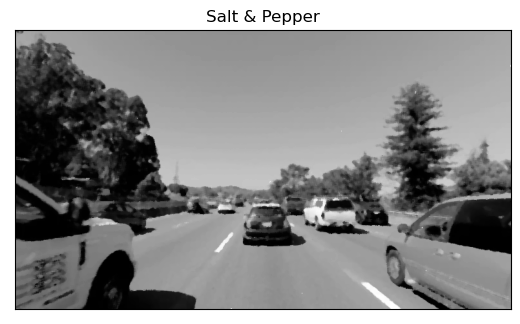

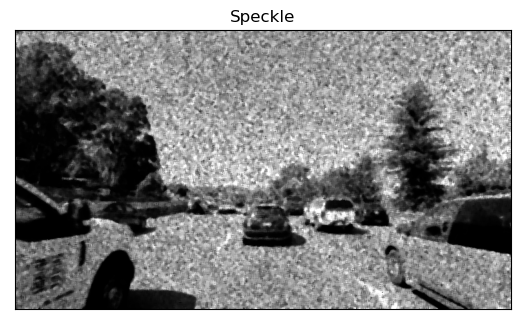

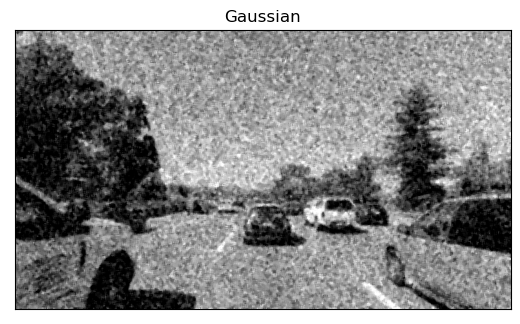

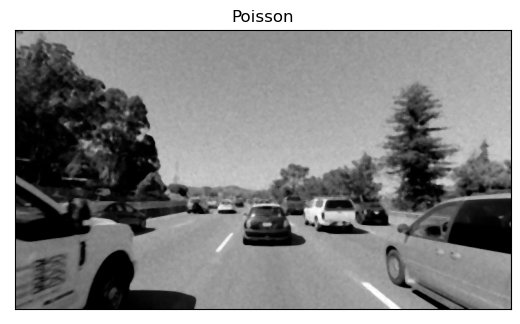

In [10]:
def median_filter(I, kernel_size = 5):
    # Получаем размеры исходного изображения
    rows, cols = I.shape[:2]
    pad = kernel_size // 2

    # Добавляем границы к изображению для корректной обработки краёв (репликация значений)
    I_padded = cv.copyMakeBorder(I, pad, pad, pad, pad, cv.BORDER_REPLICATE)

    # Создаем пустой массив для результата
    I_out = np.zeros_like(I)

    # Проходим по каждому пикселю исходного изображения
    for i in range(rows):
        for j in range(cols):
            # Извлекаем окно размером kernel_size x kernel_size вокруг текущего пикселя
            region = I_padded[i:i + kernel_size, j:j + kernel_size]
            # Вычисляем медиану в окне
            median_val = np.median(region)
            I_out[i, j] = median_val

    return I_out

Imedian = []
for img in frames:
    Imedian.append((img[0], median_filter(img[1], 5)))  
ShowImages(Imedian, 0)

<h2>взвешенной медианной</h2>

rank = 5
rank = 5
rank = 5
rank = 5
rank = 5


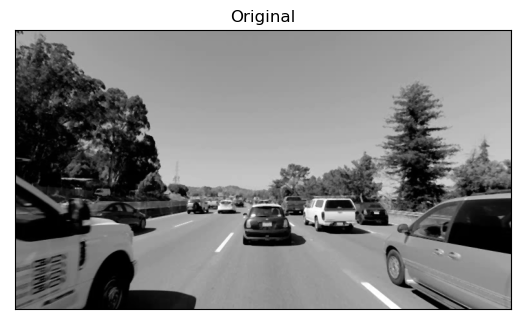

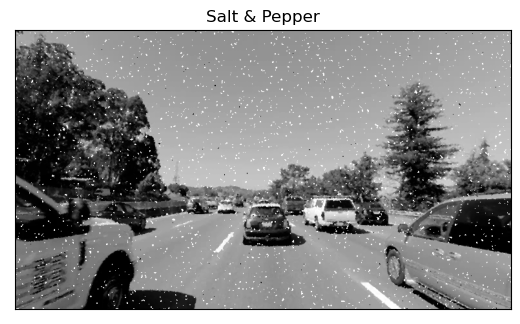

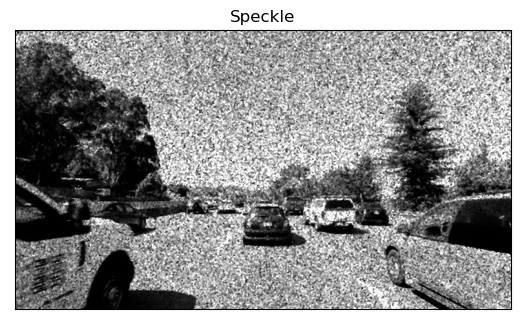

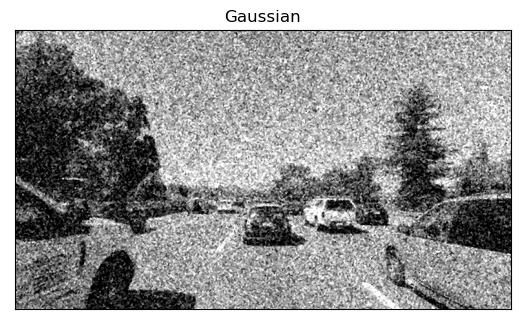

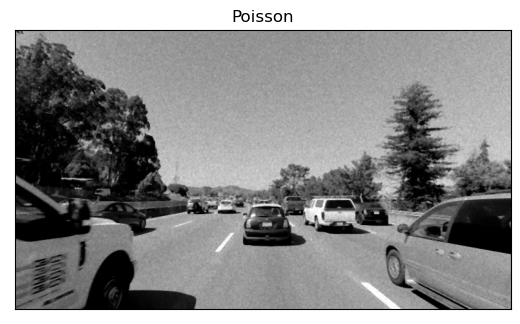

In [11]:
def WightedMedianFilter(I, weights):
  rows, cols = I.shape[0:2]
  weights = weights.astype(np.uint16)
  kernel_size = weights.shape
  rank = int(weights.sum() // 2)

  # Convert to float and make image with border
  if I.dtype == np.uint8:
    Icopy = I.astype(np.float32) / 255
  else:
    Icopy = I#.astype(np.float32)
  Icopy = cv.copyMakeBorder(Icopy, 
                            (kernel_size[0] - 1) // 2, kernel_size[0] // 2, 
                            (kernel_size[1] - 1) // 2, kernel_size[1] // 2, 
                            cv.BORDER_REPLICATE)
  # Fill arrays for each kernel item
  Ilayers = np.zeros(I.shape + (weights.sum(), ), dtype = np.float32)
  print("rank = {}".format(rank))
  if I.ndim == 2:
    n = 0
    for i in range(kernel_size[0]):
      for j in range(kernel_size[1]):
          for k in range(weights[i, j]):
            Ilayers[:, :, n] = Icopy[i:i + rows, j:j + cols]
            n += 1
  else:
    n = 0
    for i in range(kernel_size[0]):
      for j in range(kernel_size[1]):
        for k in range(weights[i, j]):
          Ilayers[:, :, :, n] = Icopy[i:i + rows, j:j + cols, :]
          n += 1

  # Sort
  Ilayers.sort()

  # And select one with rank
  if I.ndim == 2:
    Iout = Ilayers[:, :, rank]
  else:
    Iout = Ilayers[:, :, :, rank]

  # Convert back to uint if needed
  if (I.dtype == np.uint8):
    Iout = (255 * Iout).clip(0, 255).astype(np.uint8)

  return Iout

weights = np.ones((3, 3))
weights[1, 1] = 2
Iwmedian = []
for img in frames:
  Iwmedian.append((img[0], WightedMedianFilter(img[1], weights)))
ShowImages(Iwmedian, 0)

<h2>ранговой при различных размерах маски и ее коэффициентов</h2>

In [12]:
## Rank filter
## @param[in] I An image to filter
## @param[in] kernel_size The filter kernel size
## @param[in] rank The rank to use
## @return The filtered image
def RankFilter(I, kernel_size, rank):
  rows, cols = I.shape[0:2]

  # Convert to float and make image with border
  if I.dtype == np.uint8:
    Icopy = I.astype(np.float32) / 255
  else:
    Icopy = I
  Icopy = cv.copyMakeBorder(Icopy, 
                            (kernel_size[0] - 1) // 2, kernel_size[0] // 2, 
                            (kernel_size[1] - 1) // 2, kernel_size[1] // 2, 
                            cv.BORDER_REPLICATE)

  # Fill arrays for each kernel item
  Ilayers = np.zeros(I.shape + (kernel_size[0] * kernel_size[1], ), dtype = np.float32)
  if I.ndim == 2:
    for i in range(kernel_size[0]):
      for j in range(kernel_size[1]):
          Ilayers[:, :, i * kernel_size[1] + j] = Icopy[i:i + rows, j:j + cols]
  else:
    for i in range(kernel_size[0]):
      for j in range(kernel_size[1]):
        Ilayers[:, :, :, i * kernel_size[1] + j] = Icopy[i:i + rows, j:j + cols, :]

  # Sort
  Ilayers.sort()

  # And select one with rank
  if I.ndim == 2:
    Iout = Ilayers[:, :, rank]
  else:
    Iout = Ilayers[:, :, :, rank]

  # Convert back to uint if needed
  if (I.dtype == np.uint8):
    Iout = (255 * Iout).clip(0, 255).astype(np.uint8)

  return Iout

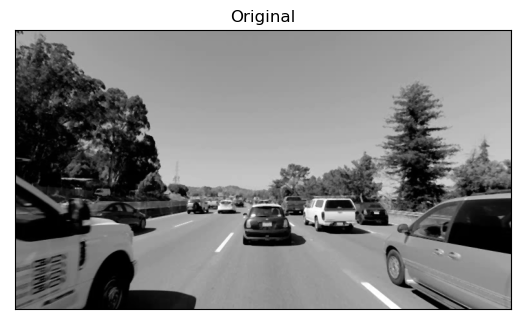

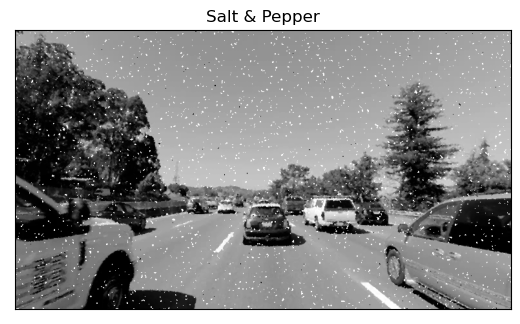

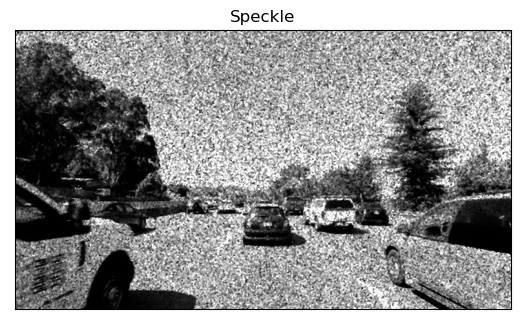

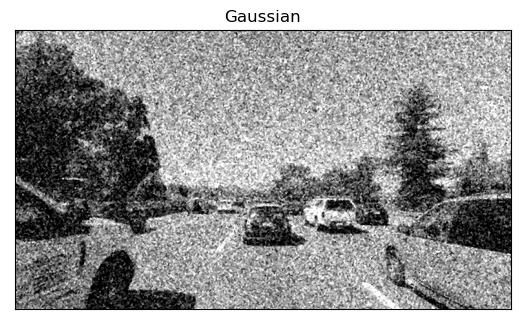

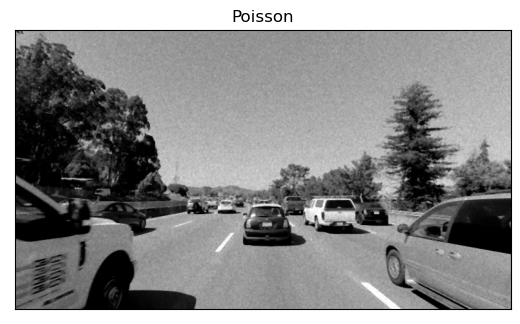

In [13]:
Imin = []
for img in frames:
  Imin.append((img[0], RankFilter(img[1], (3, 3), 0)))
ShowImages(Iwmedian, 0)

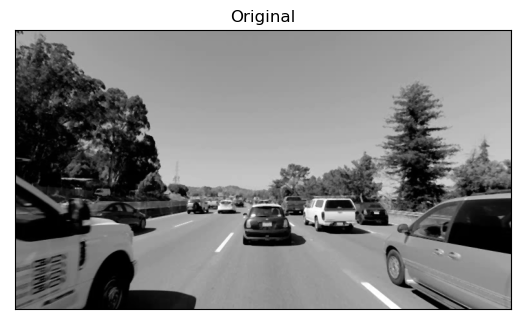

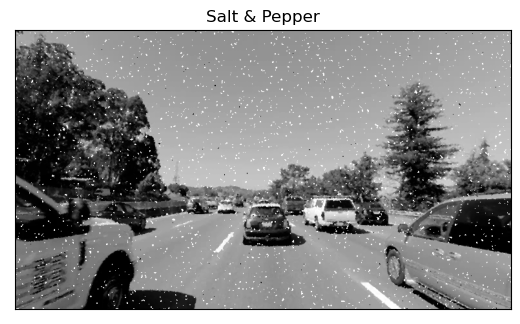

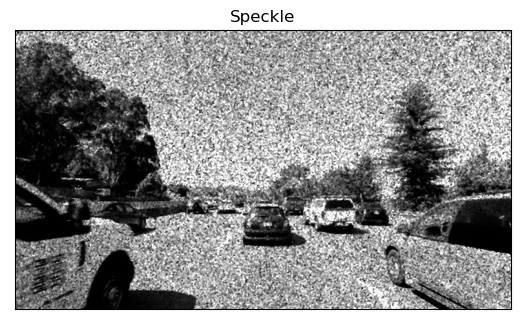

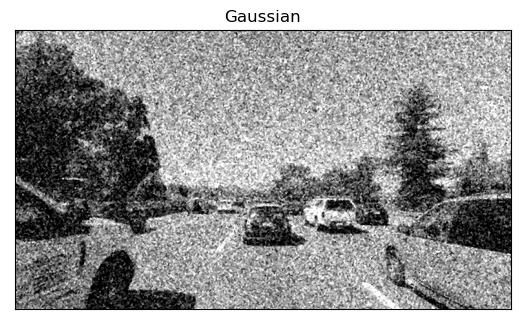

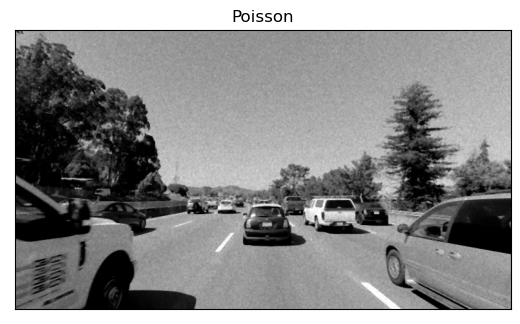

In [14]:
Imax = []
for img in frames:
  Imax.append((RankFilter(img[1], (3, 3), 1)))
ShowImages(Iwmedian, 0)

<h2>винеровской при различных размерах маски и ее коэффициентов</h2>

In [15]:
## The Weiner filter
## @param[in] img_noisy An image to filter
## @param[in] kernel Filter kernel
def WeinerFilter(I, kernel):
  rows, cols = I.shape[0:2]

  # Convert to float32
  if I.dtype == np.uint8:
    Iout = I.astype(np.float32) / 255
  else:
    Iout = np.copy(I)

  kernel_size = kernel.shape

  # Convert to float and make image with border
  if I.dtype == np.uint8:
    Icopy = I.astype(np.float32) / 255
  else:
    Icopy = I
  Icopy = cv.copyMakeBorder(Icopy, 
                            (kernel_size[0] - 1) // 2, kernel_size[0] // 2, 
                            (kernel_size[1] - 1) // 2, kernel_size[1] // 2, 
                            cv.BORDER_REPLICATE)

  # Split into layers
  bgr_planes = cv.split(Icopy)
  bgr_planes_2 = []

  kernel_power = np.power(kernel, 2)

  # For all layers
  for plane in bgr_planes:
    # Calculate temporary matrices for I ** 2
    plane_power = np.power(plane, 2)
    
    m = np.zeros(I.shape[0:2], np.float32)
    q = np.zeros(I.shape[0:2], np.float32)
    
    # Calculate variance values
    for i in range(kernel_size[0]):
      for j in range(kernel_size[1]):
        m = m + kernel[i, j] * plane[i:i + rows, j:j + cols]
        q = q + kernel_power[i, j] * plane_power[i:i + rows, j:j + cols]
    m = m / np.sum(kernel)
    q = q / np.sum(kernel)
    q = q - m * m
    
    # Calculate noise as an average variance
    v = np.sum(q) / I.size
    
    # Do filter
    plane_2 = plane[(kernel_size[0] - 1) // 2:(kernel_size[0] - 1) // 2 + rows, 
      (kernel_size[1] - 1) // 2:(kernel_size[1] - 1) // 2 + cols]
    plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)
    bgr_planes_2.append(plane_2)

  # Merge image back  
  Iout = cv.merge(bgr_planes_2)

  # Convert back to uint if needed
  if (I.dtype == np.uint8):
    Iout = (255 * Iout).clip(0, 255).astype(np.uint8)

  return Iout



/tmp/ipykernel_137784/3627354681.py:54: RuntimeWarning: divide by zero encountered in divide
  plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)
/tmp/ipykernel_137784/3627354681.py:54: RuntimeWarning: invalid value encountered in multiply
  plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)
/tmp/ipykernel_137784/3627354681.py:62: RuntimeWarning: invalid value encountered in cast
  Iout = (255 * Iout).clip(0, 255).astype(np.uint8)


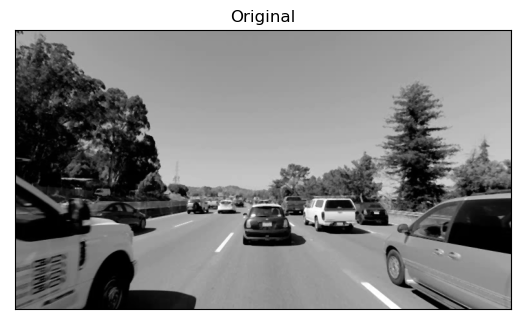

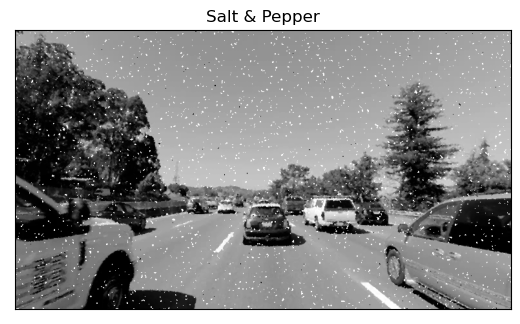

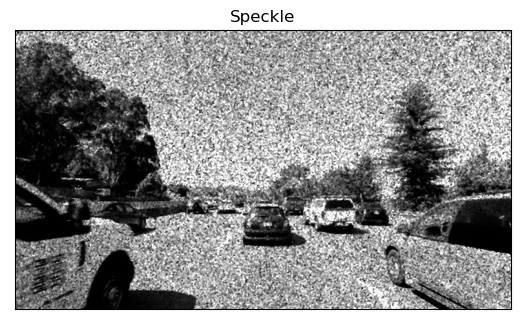

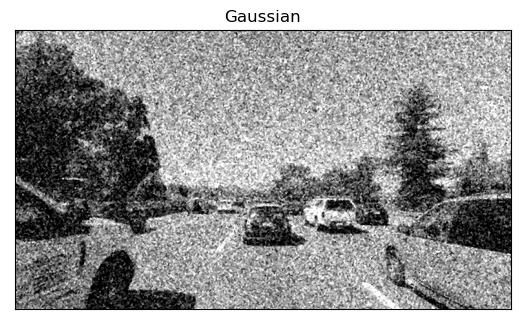

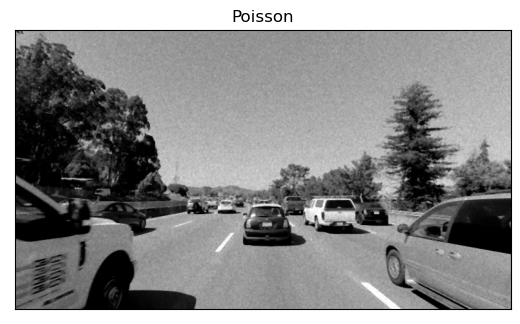

In [16]:
Iwin = []
kernel_3x3 = np.ones((3, 3), dtype=np.float32) / 9
for img in frames:
  Imin.append((img[0], WeinerFilter(img[1], kernel_3x3)))
ShowImages(Iwmedian, 0)

/tmp/ipykernel_137784/3627354681.py:54: RuntimeWarning: divide by zero encountered in divide
  plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)
/tmp/ipykernel_137784/3627354681.py:54: RuntimeWarning: invalid value encountered in multiply
  plane_2 = np.where(q < v, m, (plane_2 - m) * (1 - v / q) + m)
/tmp/ipykernel_137784/3627354681.py:62: RuntimeWarning: invalid value encountered in cast
  Iout = (255 * Iout).clip(0, 255).astype(np.uint8)


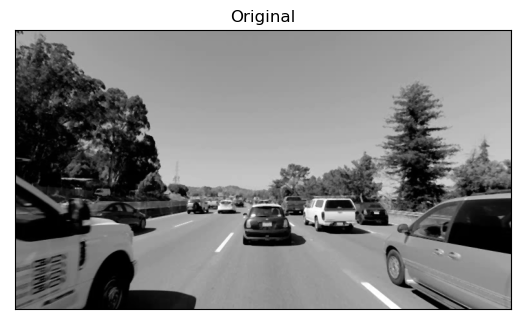

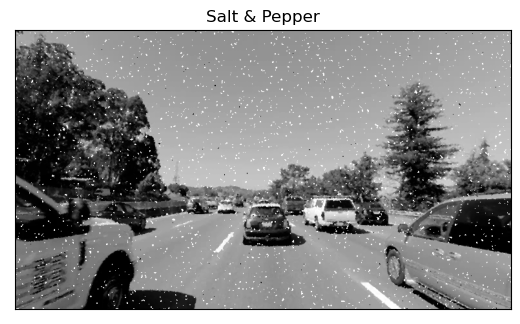

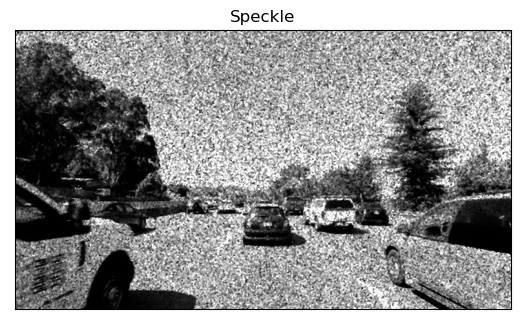

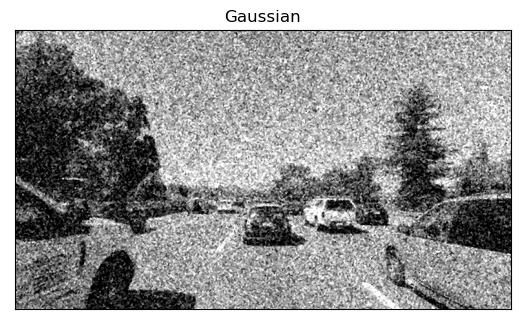

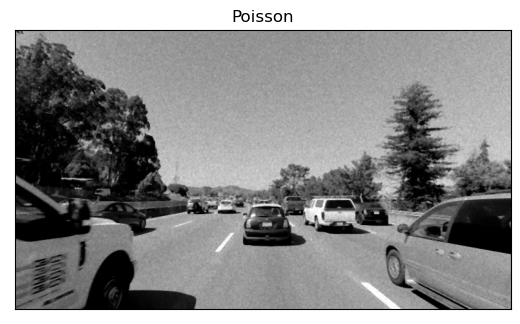

In [17]:
Iwin1 = []
kernel_5x5 = np.ones((5, 5), dtype=np.float32) / 25
for img in frames:
  Imin.append((img[0], WeinerFilter(img[1], kernel_5x5)))
ShowImages(Iwmedian, 0)

<h2> Реализовать адаптивную медианную фильтрацию. В ОТЧЕТ</h2>

/tmp/ipykernel_137784/1655742590.py:38: RuntimeWarning: overflow encountered in scalar subtract
  B2 = z_xy - z_max


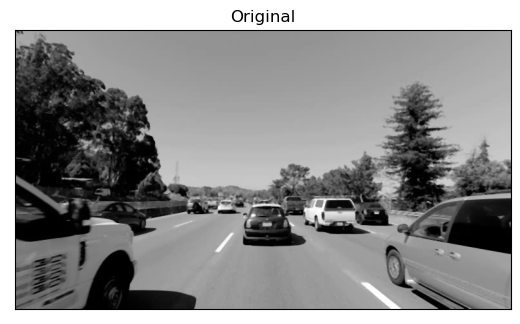

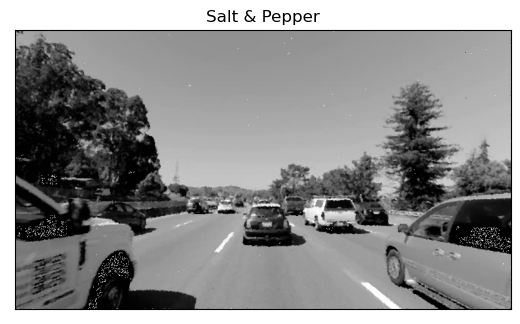

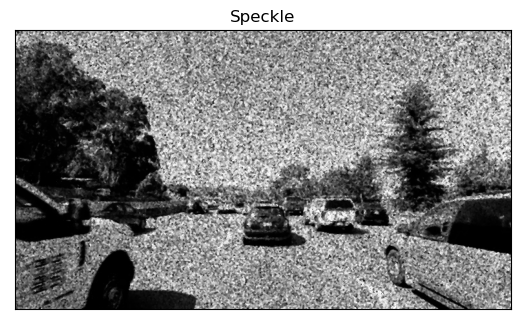

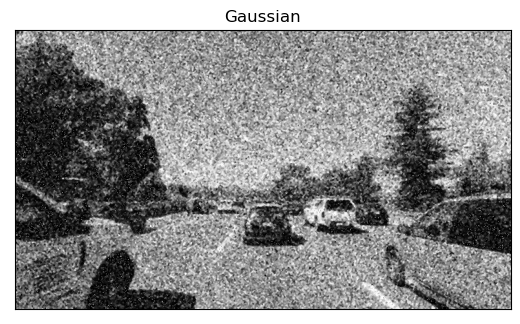

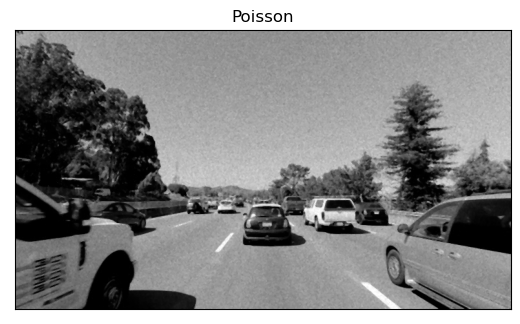

In [18]:
def adaptive_median_filter(I, s_max=7, s_init=3):

    # Определяем размеры изображения
    rows, cols = I.shape
    # Результирующее изображение
    I_out = np.zeros_like(I)
    
    # Проходим по каждому пикселю изображения
    for i in range(rows):
        for j in range(cols):
            z_xy = I[i, j]  # интенсивность текущего пикселя
            s = s_init      # начальный размер окна
            # Флаг, указывающий, что результат получен
            processed = False
            
            while not processed:
                # Определяем половину окна
                half = s // 2
                # Определяем границы окна, учитывая края изображения
                rmin = max(i - half, 0)
                rmax = min(i + half + 1, rows)
                cmin = max(j - half, 0)
                cmax = min(j + half + 1, cols)
                
                # Извлекаем окно
                window = I[rmin:rmax, cmin:cmax]
                z_min = np.min(window)
                z_max = np.max(window)
                z_med = np.median(window)
                
                # Шаг 1: вычисляем A1 и A2
                A1 = z_med - z_min
                A2 = z_med - z_max
                
                if A1 > 0 and A2 < 0:
                    # Переходим к шагу 2
                    B1 = z_xy - z_min
                    B2 = z_xy - z_max
                    if B1 > 0 and B2 < 0:
                        I_out[i, j] = z_xy
                    else:
                        I_out[i, j] = z_med
                    processed = True
                else:
                    # Если условие шага 1 не выполнено, увеличиваем окно
                    s += 2
                    if s > s_max:
                        # Достигли максимального размера окна, возвращаем исходное значение
                        I_out[i, j] = z_xy
                        processed = True
                        
    return I_out


Iadaptive = []
for img in frames:
    Iadaptive.append((img[0], adaptive_median_filter(img[1], 7, 3)))
ShowImages(Iadaptive, 0)

Высокочастотная фильтрация. Выбрать исходное изображение. Выделить границы фильтрами Робертса, Превитта, Собела, Лапласа, алгоритмом Кэнни.

<h2>Робертса</h2>

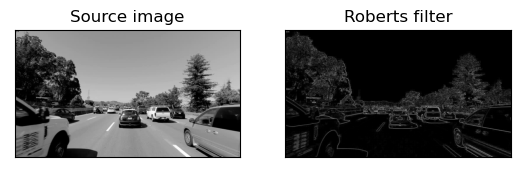

In [95]:
def RobertsFilter(I):
  # Convert to float
  if I.dtype == np.uint8:
    Iout = I.astype(np.float32) / 255
  else:
    Iout = np.copy(I)

  # Define kernels for X and Y
  kernel_x = np.array([[1, -1], [ 0, 0]])
  kernel_y = np.array([[1,  0], [-1, 0]])

  # Perform convolution
  Ix = cv.filter2D(Iout, -1, kernel_x)
  Iy = cv.filter2D(Iout, -1, kernel_y)
  Iout = cv.magnitude(Ix, Iy)

  # Convert back to uint if needed
  if I.dtype == np.uint8:
    Iout = (255 * Iout).clip(0, 255).astype(np.uint8)

  return Iout

Iroberts = RobertsFilter(frame)
ShowImages([("Source image", frame), 
            ("Roberts filter", Iroberts)], 2)

<h2>Превитта В ОТЧЕТ</h2>

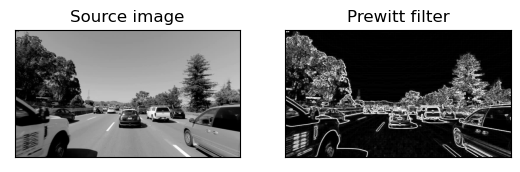

In [100]:
def prewitt_filter(I):
    # Преобразуем изображение в градации серого, если оно цветное
    if len(I.shape) == 3:
        I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)

    # Определяем горизонтальные и вертикальные ядра Превитта
    kernel_prewitt_x = np.array([[1, 0, -1], 
                                  [1, 0, -1], 
                                  [1, 0, -1]], dtype=np.float32)

    kernel_prewitt_y = np.array([[1, 1, 1], 
                                  [0, 0, 0], 
                                  [-1, -1, -1]], dtype=np.float32)

    # Применяем фильтр Превитта по горизонтали и вертикали
    grad_x = cv2.filter2D(I, cv2.CV_64F, kernel_prewitt_x)
    grad_y = cv2.filter2D(I, cv2.CV_64F, kernel_prewitt_y)

    # Рассчитываем общую градиентную силу
    grad = np.sqrt(grad_x**2 + grad_y**2)
    grad = np.clip(grad, 0, 255).astype(np.uint8)

    return grad

Iroberts = prewitt_filter(frame)
ShowImages([("Source image", frame), 
            ("Prewitt filter", Iroberts)], 2)

<h2>Собела В ОТЧЕТ</h2>

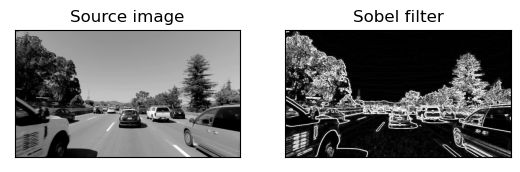

In [102]:
def sobel_filter(I):
    # Преобразуем изображение в градации серого, если оно цветное
    if len(I.shape) == 3:
        I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)

    # Определяем горизонтальные и вертикальные ядра Превитта
    kernel_prewitt_x = np.array([[1, 0, -1], 
                                  [2, 0, -2], 
                                  [1, 0, -1]], dtype=np.float32)

    kernel_prewitt_y = np.array([[1, 2, 1], 
                                  [0, 0, 0], 
                                  [-1, -2, -1]], dtype=np.float32)

    # Применяем фильтр Превитта по горизонтали и вертикали
    grad_x = cv2.filter2D(I, cv2.CV_64F, kernel_prewitt_x)
    grad_y = cv2.filter2D(I, cv2.CV_64F, kernel_prewitt_y)

    # Рассчитываем общую градиентную силу
    grad = np.sqrt(grad_x**2 + grad_y**2)
    grad = np.clip(grad, 0, 255).astype(np.uint8)

    return grad

Iroberts = sobel_filter(frame)
ShowImages([("Source image", frame), 
            ("Sobel filter", Iroberts)], 2)

<h2>Лапласа</h2>

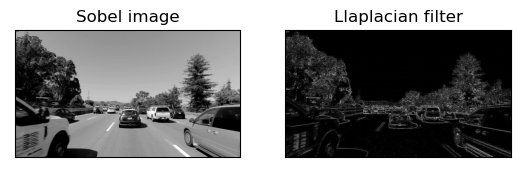

In [104]:
def laplacian_filter(I):
    # Преобразуем изображение в оттенки серого, если оно цветное
    if len(I.shape) == 3:
        I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)

    # Ядро оператора Лапласа (можно использовать другие варианты)
    kernel_laplacian = np.array([[0, 1, 0], 
                                  [1, -4, 1], 
                                  [0, 1, 0]], dtype=np.float32)

    # Применяем свертку с ядром Лапласа
    laplacian = cv2.filter2D(I, cv2.CV_64F, kernel_laplacian)

    # Преобразуем результат в 8-битный формат
    laplacian = np.clip(np.abs(laplacian), 0, 255).astype(np.uint8)

    return laplacian

Iroberts = laplacian_filter(frame)
ShowImages([("Sobel image", frame), 
            ("Llaplacian filter", Iroberts)], 2)

<h2>Кэнни</h2>

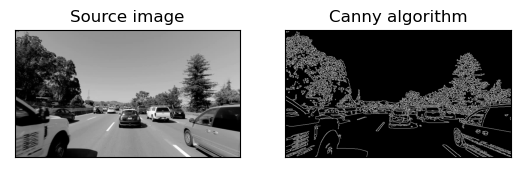

In [105]:
Icanny = cv.Canny(frame, 50, 220)
ShowImages([("Source image", frame), 
            ("Canny algorithm", Icanny)], 2)